<a href="https://colab.research.google.com/github/hmerkle/Final_Project_IANNWTF_Image_Colorization/blob/main/Final_Version_ImageColorization_Group14.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image colorization with cGAN

In this notebook we present our implementation of a cGAN to colorize black and white picture inspired by the paper of [**Isola et al.**](https://arxiv.org/pdf/1611.07004.pdf). To learn more about our implementation and our results for differnt modifications you can read our paper. The default values are the values we achieved the best results with. If you want to run the model without changes you only have to attend to the "Import data" section and then run the whole script. Else you can modify the Parameters in the corresponding section.


## **What is image colorization?**

Image colorization aims to convert black and white images to a realistic colorful images. This is a challenging task as there are many possibles color values which can be assigned to the same luminace.

To realize the task, we built a Genertive Adversarial Network (GAN) including a Generator which is structured as a U-Net and a Discriminator.
In the process we convert the RGB images into Lab colorspace. The L-channel is used as the input to the Generator which generates the a and b color channels. The Discriminator concatenates the real and generated a and b color channels with the original L-channel and decides if the image is real or fake.

The challenge is, to find the equilibrium between the generator and discriminator loss to create realistic colorful images.

#Imports



In [ ]:
import os
import zipfile
import random
import matplotlib.pyplot as plt
import numpy as np
import time
from skimage import color
import cv2

import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout, Conv2D, Conv2DTranspose, Reshape, Activation, BatchNormalization, LeakyReLU, Concatenate, ReLU, ZeroPadding2D
from keras.initializers import RandomNormal
import tqdm.notebook as note

#Hyperparameters


In [ ]:
#@markdown #** Hyperparameters**
#@markdown ---

IMG_SIZE = 256#@param {type:"number"}
#@markdown note: you might have to decrease NUM_IMGS if your RAM is overloaded
NUM_IMGS = 2000#@param {type:"number"}
TRAIN_RATIO = 0.8#@param {type:"number"}
BATCH_SIZE = 4#@param {type:"number"}
NUM_EPOCHS = 30#@param {type:"number"}
LEARNING_RATE = 0.0002#@param {type:"number"}
BETA = 0.5#@param {type:"number"}
# Droprate for the Generator
DROP_G = 0.5#@param {type:"number"}
# The Impact the L1 loss has on the generator loss
LAMBDA = 100#@param {type:"number"}

# Import data
In our task we use the COCO validation and testing dataset. Since there are too many different categories present in the complete dataset to reach satisfactory resuts, we manually selected 2240 images from the categories landscape and nature. To obtain the same dataset you have to
1. click on this [link](https://drive.google.com/drive/folders/1-9yJWgDmB3hyEBaJoQ8hJm2rNnQHlYZg?usp=sharing) to get access to the drive folder
2. click on the folder "selected_data_COCO" and select "Drive-Verknüpfung hinzufügen" to add the folder to your "MyDrive"
3. mount your drive by running the following cell and allow the access

If you want to use another dataset, you can add it to your google drive and change the path in the next cell. However, there are several other ways to include datasets.






Source: [COCO dataset website](https://cocodataset.org/#home)

In [ ]:
# Mount drive to colab to import image dataset
from google.colab import drive
drive.mount('/content/drive')
# define path to dataset
path = '/content/drive/MyDrive/selected_data_COCO' # change the path here if necessary
print("Dataset Length: ", len(os.listdir(path)))

Mounted at /content/drive
Dataset Length:  2240


## Load and prepare Dataset

In the following cell, we convert the images to RGB, resize to our predefined image size and finally convert them to Lab. Then, we create arrays with the L- and ab-channels for the test and train data.

In [ ]:
def load_dataset(path, TRAIN_RATIO, IMG_SIZE, NUM_IMGS):
    """
    Utility function that loads data from path, resizes and creates numpy datasets.

    Args:
      path: path to data (string)
      TRAIN_RATIO: split ratio for train data (float)
      IMG_SIZE: size of images (int)
      NUM_IMGS: total number of images (int)

    Results:
      l_train_images: l channels for training (np.array)
      ab_train_images: ab channels for training (np.array)
      l_test_images: l channels for testing (np.array)
      ab_test_images: ab channels for testing (np.array)
    """
    # define a length of train data
    train_len = round(NUM_IMGS*TRAIN_RATIO)

    # initialize arrays for different color channels
    l_train_images = []
    ab_train_images = []
    l_test_images = []
    ab_test_images = []

    count = 0
    # convert images to lab and fill arrays with images
    for img in os.listdir(path):
        if count < NUM_IMGS:
            bgr_img = cv2.imread(os.path.join(path, img))
            # CV read uses BGR -> convertion to RGB necessary by inverting images
            rgb_img = np.flip(bgr_img, axis=-1)
            # resize images with resampling using pixel area relation
            rgb_img = cv2.resize(rgb_img, (IMG_SIZE, IMG_SIZE), interpolation = cv2.INTER_AREA)
            # convert rgb to lab
            lab_img = color.rgb2lab(rgb_img)

            # Data augmentation: Horizontal flip for train data with 0.5 probability
            if count < train_len:
                if random.randint(0,1) == 1:
                    # Use Flip code 1 to flip horizontally
                    lab_img = cv2.flip(lab_img, 1)
                # create train data
                l_train_images.append(np.reshape(lab_img[:, :, 0], (IMG_SIZE, IMG_SIZE, 1)))   # reshape to avoid later issues
                ab_train_images.append(lab_img[:, :, 1:])
            else:
                # create test data
                l_test_images.append(np.reshape(lab_img[:, :, 0], (IMG_SIZE, IMG_SIZE, 1)))   # reshape to avoid later issues
                ab_test_images.append(lab_img[:, :, 1:])
            count += 1

    return l_train_images, ab_train_images, l_test_images, ab_test_images

This pipeline creates the final tensor dataset.

In [ ]:
def prepare(l_images, ab_images, BATCH_SIZE):
    """
    Pipeline to create tensorflow dataset and prepare data.

    Args:
      data_l: original l channel (np.array)
      data_ab: original ab channel (np.array)
      BATCH_SIZE: batch size (int)

    Results:
      data: prepared data (tf.data.Dataset)
    """
    # Create tensorflow dataset
    data = tf.data.Dataset.from_tensor_slices((l_images, ab_images))

    # convert datatype to float32
    data = data.map(lambda l_img, ab_img: (tf.cast(l_img, tf.float32), tf.cast(ab_img, tf.float32)))

    # normalize image pixels to range ~[-1, 1]
    data = data.map(lambda l_img, ab_img: ((l_img/50.-1.), (ab_img/110.)))

    #shuffle, batch, prefetch
    data = data.shuffle(1000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

    #return preprocessed dataset
    return data

In [ ]:
# create arrays with the l- and ab-channels for training and testing
l_train_images, ab_train_images, l_test_images, ab_test_images = load_dataset(path, TRAIN_RATIO, IMG_SIZE, NUM_IMGS)

# Prepare the tensor datasets
train_ds = prepare(l_train_images, ab_train_images, BATCH_SIZE)
test_ds = prepare(l_test_images, ab_test_images, BATCH_SIZE)

### Visualize CIE Lab color space

For illustration purpose we load one image of the dataset and convert it to Lab. Here you might have to change the image path, if you are working with a different dataset.

**Background on Image representation:**

An image usually consits of a rank-3 array with the first and second axis including its height and width and the last axis the color information.

**RGB:**
The third axis of an RGB image has a dimension of three. In the RGB color space each pixel has a red, a green and a blue color channel. All three add together to a united color and therefore realistic colorful image.

**Lab:**
The Lab color space also consits of three channels. The first channel is the L-channel which is relevant for the lightness of the image. It only contains the contrast between the darkest and lightest spots in an image. The a-channel contains a color spectrum between green and red and the b-channel contains a spectrum between blue and yellow.

For our colorization task we use the Lab color space. The L-channel is used as an input for the Generator.

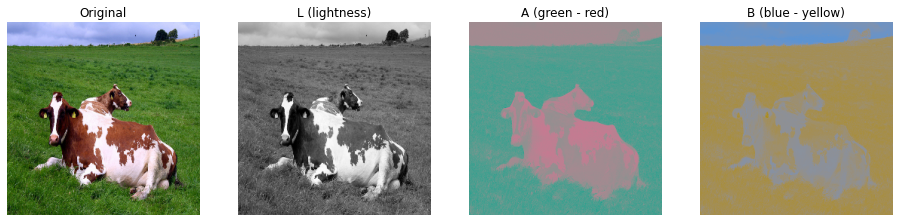

In [ ]:
# load one image from dataset
display_img = cv2.imread('/content/drive/MyDrive/selected_data_COCO/000000000019.jpg')
# convert to correct size and to RGB
rgb_img = cv2.resize(np.flip(display_img, axis=-1) , (IMG_SIZE, IMG_SIZE))
# convert rgb to lab
lab_img = color.rgb2lab(rgb_img)

fig_lab = plt.figure(figsize=(20,10))
# Plot original image and 3 channels
for i, title in enumerate(["Original", "L (lightness)","A (green - red)","B (blue - yellow)"]):
    channel = i - 1

    if title == "Original":
      temp = lab_img
    else:
      temp = np.zeros(lab_img.shape)
      # increase brightness for a and b colorspace for better visability
      if channel != 0:
          temp[:,:,0] = 60
      temp[:,:,channel] = lab_img[:,:,channel]

    ax = fig_lab.add_subplot(1,5,i+1)
    ax.imshow(color.lab2rgb(temp)); ax.axis("off")
    ax.set_title(title)
plt.show()

#The cGAN
Here you can find our model architecture and training process.


## The Generator

The generator is based on a U-Net structure. It has an encoder–decoder structure. In the U-Net the images are first downsampled until a bottleneck layer is reached and then upsampled again until the desired output shape is reached. Important in a U-Net is, that skip connections are used to concatenate the outputs of the downsampling process with the outputs of the upsampling process. This structure was inspired by this [paper](https://arxiv.org/pdf/1611.07004.pdf).

In [ ]:
class Downsampler(tf.keras.layers.Layer):
    """
    Downsampling layer for the Generator.

    Structure: 1 convolutional layer followed by a batch normalization and Leaky ReLU activation function with slope 0.2.
    """

    def __init__(self, depth, apply_batchnorm = True):
        """
        Inititalizer.

        Args:
          depth: number of filters (int)
          apply_batchnorm: whether to apply batchnorm. Default:True (float)
        """
        super(Downsampler, self).__init__()

        self.apply_batchnorm = apply_batchnorm
        # Initializer generating tensors with normal distribution
        init = RandomNormal(mean=0.0, stddev=0.02)

        self.conv = Conv2D(filters=depth, kernel_size=4, strides=2, padding='same', kernel_regularizer = init, use_bias=False) # no bias as batch normalization is used
        self.batchnorm = BatchNormalization()
        self.act = LeakyReLU(alpha=0.2)


    @tf.function
    def call(self, inputs):
        """
        Call function of the model. Propagates input through the layers.

        Args:
            inputs: input to the model (tf.tensor)
        Returns:
            downsampled input
        """
        x = self.conv(inputs)

        if self.apply_batchnorm:
          x = self.batchnorm(x)

        x = self.act(x)

        return x

In [ ]:
class Upsampler(tf.keras.layers.Layer):
    """
    Upsampling layer for the Generator.

    Structure: 1 convolutional transpositional layer followed by a batch normalization, Dropout and ReLU activation function.
    """

    def __init__(self, depth, DROP_G):
        """
        Inititalizer.

        Args:
          depth: number of filters (int)
          DROP_G: dropout value (float)
        """
        super(Upsampler, self).__init__()
        # Initializer generating tensors with normal distribution
        init = RandomNormal(mean=0.0, stddev=0.02)

        self.tconv = Conv2DTranspose(filters=depth, kernel_size=4, strides=2, padding='same', kernel_regularizer = init, use_bias=False) # no bias as batch normalization is used
        self.batchnorm = BatchNormalization()
        self.dropout = Dropout(DROP_G)
        self.act = ReLU()

        self.concat = Concatenate()

    @tf.function
    def call(self, input1, input2, training):
        """
        Call function of the model. Propagates input through the layers.

        Args:
            input1: first input to the model for upsampling(tf.tensor)
            input2: second input to the model for concatenation (tf.tensor)
            training: whether to use training (Bool)
        Returns:
            upsampled and concatenated inputs
        """
        x = self.tconv(input1)
        x = self.batchnorm(x)

        if training == True:
            x = self.dropout(x)

        x = self.act(x)

        concatenated = self.concat([input2, x])

        return concatenated

In [ ]:
class Generator(tf.keras.Model):
    """
    Generator of the GAN with U-Net structure.
    Instantiates Downsampling and Upsampling layers and concatenates outputs.

    Structure: Encoder: C64-C128-C256-C512-C512-C512-C512-C512 with C = Conv2D-BatchNorm-LeakyReLU
               Decoder: CD512-CD512-CD512-C512-C256-C128-C64 with CD = Conv2D-BatchNorm-Dropout-ReLU
               All layers with stride 1 and kernel size 4.
               Output layer with filter size 2 and tanh activation function.
    """

    def __init__(self, DROP_G):
        """
        Inititalizer.

        Args:
          DROP_G: dropout value (float)
        """
        super(Generator, self).__init__()
        # Initializer generating tensors with normal distribution
        init = RandomNormal(mean=0.0, stddev=0.02)
        # numbers of filters
        depth = 64

        # C64-C128-C256-C512-C512-C512-C512-C512
        self.down_1 = Downsampler(depth, False)
        self.down_2 = Downsampler(depth*2)
        self.down_3 = Downsampler(depth*4)
        self.down_4 = Downsampler(depth*8)
        self.down_5 = Downsampler(depth*8)
        self.down_6 = Downsampler(depth*8)
        self.down_7 = Downsampler(depth*8)

        # bottleneck layer
        self.down_8 = Downsampler(depth*8, False)

        # CD512-CD512-CD512-C512-C256-C128-C64
        self.up_1 = Upsampler(depth*8, DROP_G)
        self.up_2 = Upsampler(depth*8, DROP_G)
        self.up_3 = Upsampler(depth*8, DROP_G)
        self.up_4 = Upsampler(depth*8, 0)
        self.up_5 = Upsampler(depth*4, 0)
        self.up_6 = Upsampler(depth*2, 0)
        self.up_7 = Upsampler(depth, 0)

        # Output layer with generated ab-channel
        self.out = Conv2DTranspose(filters = 2, kernel_size = 4, strides = 2, padding='same', activation='tanh', kernel_initializer=init)


    @tf.function
    def call(self, inputs, training):
        """
        Call function of the model. Propagates input through the layers.

        Args:
            inputs: real or generated ab-channels with shape (BATCH_SIZE, 256, 256, 1) (tf.tensor)
            training: whether to use training (Bool)
        Return:
            generated tensor with shape (BATCH_SIZE, 256, 256, 2)
        """

        # downsampling
        x1 = self.down_1(inputs)             # out: 128, 128, 64
        x2 = self.down_2(x1)                 # out: 64, 64, 128
        x3 = self.down_3(x2)                 # out: 32, 32, 256
        x4 = self.down_4(x3)                 # out: 16, 16, 512
        x5 = self.down_5(x4)                 # out: 8, 8, 512
        x6 = self.down_6(x5)                 # out: 4, 4, 512
        x7 = self.down_7(x6)                 # out: 2, 2, 512

        x8 = self.down_8(x7)                 # out: 1, 1, 512

        # upsampling
        x9 = self.up_1(x8, x7, training)     # out: 2, 2, 1024
        x10 = self.up_2(x9, x6, training)    # out: 4, 4, 1024
        x11 = self.up_3(x10, x5, training)   # out: 8, 8, 1024
        x12 = self.up_4(x11, x4, training)   # out: 16, 16, 1024
        x13 = self.up_5(x12, x3, training)   # out: 32, 32, 512
        x14 = self.up_6(x13, x2, training)   # out: 64, 64, 256
        x15 = self.up_7(x14, x1, training)   # out: 128, 128, 128

        out = self.out(x15)                   # out: 256, 256, 2

        return out

## The Discriminator
The Discriminator has the structure of a patchGAN.  Instead of returning only one probability value for the whole image, a patchGAN decides whether patches of an image are real or generated and returns a matrix of probability values. We decided to base our implementation on the patchGAN structure proposed by [Isola et al.](https://arxiv.org/pdf/1611.07004.pdf). We decided on a model implementation with a receptive field size of 70x70.

In [ ]:
class Discriminate(tf.keras.layers.Layer):
    """
    Downsampling layer for Discriminator.

    Structure: Convolutional layer followed by a batch normalization and Leaky ReLU activation function with slope 0.2.
    """

    def __init__(self, depth, stride, apply_batchnorm = True, apply_drop = False):
        """
        Inititalizer.

        Args:
          depth: number of filters (int)
          stride: number of strides (int)
          apply_batchnorm: whether batch normalization is applied (bool)
        """
        super(Discriminate, self).__init__()

        self.apply_batchnorm = apply_batchnorm
        self.apply_drop = apply_drop
        # Initializer generating tensors with normal distribution
        init = RandomNormal(mean=0.0, stddev=0.02)

        self.conv = Conv2D(filters=depth, kernel_size=4, strides=stride, padding="same", kernel_regularizer = init, use_bias=False) # no bias as batch normalization is used
        self.batchnorm = BatchNormalization()
        self.dropout = Dropout(0.3)
        self.act = LeakyReLU(alpha=0.2)

    @tf.function
    def call(self, inputs, training):
        """
        Call function of the model. Propagates input through the layers.

        Args:
            inputs: input to the model (tf.Tensor)
        Returns:
            Downsampled input
        """
        x = self.conv(inputs)

        if self.apply_batchnorm == True:
          x = self.batchnorm(x)

        if training == True:
          if self.apply_drop == True:
            x = self.dropout(x)

        x = self.act(x)
        return x

In [ ]:
class Discriminator(tf.keras.Model):
    """
    Discriminator of the GAN.

    Structure: C64-C128-C256-C512 with C = Conv2D-BatchNorm-LeakyReLU
               First three layers with stride 2 and fourth layer with stride 1
               No BatchNorm in first layer
               Zero Padding applied before and after 4th layer
               Convolutional layer as output with sigmoid activation function
    """

    def __init__(self):
        """
        Inititalizer.

        Args:
          depth: number of filters (int)
        """
        super(Discriminator, self).__init__()

        init = RandomNormal(mean=0.0, stddev=0.02) # Initializer generating tensors with normal distribution
        depth = 64

        # C64-C128-C256-C512
        self.gaussian_noise = tf.keras.layers.GaussianNoise(0.1)
        self.discr_1 = Discriminate(depth, 2, False, False) # no batchnorm
        self.discr_2 = Discriminate(depth*2, 2)
        self.discr_3 = Discriminate(depth*4, 2)

        self.discr_extra = Discriminate(depth*8, 1, True, True) # apply dropout
        self.conv_1 = Conv2D(filters=1, kernel_size=4, strides=1, padding='same', activation="sigmoid", kernel_regularizer = init)

    @tf.function
    def call(self, l_input, ab_input, training):
        """
        Call function of the model. Propagates input through the layers.

        Args:
            l_input: real or generated l-channels with shape (BATCH_SIZE, 256, 256, 1) (tf.Tensor)
            ab_input: real or generated ab-channels with shape (BATCH_SIZE, 256, 256, 2) (tf.Tensor)
        Return:
            Patch with shape (BATCH_SIZE, 32, 32, 1)
        """
        lab_input = tf.concat([l_input, ab_input], -1)
        x = self.gaussian_noise(lab_input)
        x = self.discr_1(x, training)
        x = self.discr_2(x, training)
        x = self.discr_3(x, training)

        x = self.discr_extra(x, training)
        x = self.conv_1(x)
        return x

## Utility functions for the model

### Losses

**Discriminator Loss**

The Discriminator loss is calculated by how well it classifies original images as real (label 1) and generated images as fake (label 0). Binary cross entropy is used.

In [ ]:
def get_discriminator_loss(bce_loss, real_prediction, fake_prediction):

    """
    Utility function that calculates the discriminator loss by how well the discriminator detected generated ab-channels as fake and original ab-channels as real.
    Args:
      bce_loss: function used for calculating the loss (tf.keras.losses)
      real_prediction: discriminator prediction of truth value of generated ab-channel (tf.Tensor)
      fake_prediction: discriminator prediction of truth value of original ab-channel (tf.Tensor)

    Results:
      total_discr_loss: Total discriminator loss (tf.Tensor)
    """
    #  Instantiate matrix for label smoothing
    label_smooth = tf.random.uniform(shape=real_prediction.shape, maxval=0.1)

    # compute BCE between discriminators output on real images and all labels = 1
    real_loss = bce_loss(real_prediction, tf.ones_like(real_prediction) - label_smooth) # label smoothing
    # compute BCE between  discriminators output on fake images and all labels = 0
    fake_loss = bce_loss(fake_prediction, tf.zeros_like(fake_prediction) + label_smooth) # label smoothing

    # Add them both to receive the resulting loss of the discriminator
    total_discr_loss = real_loss + fake_loss

    return total_discr_loss

**Generator Loss**

The Generator loss is calculated by how well the Generator fools the Discriminator with the generated images as being real (label 1). Binary cross entropy is used. In addition, we apply L1 loss to receive output images which are more similar to the original images. Lambda regulates the influence of the L1 loss term.

In [ ]:
def get_generator_loss(bce_loss, fake_prediction, generated_img, original_img):

    """
    Utility function that calculates the generator loss by how well the generator was able to fool the discriminator.
    Args:
      bce_loss: function used for calculating the loss (tf.keras.losses)
      fake_prediction: discriminator prediction of truth value of generated ab-channel (tf.tensor)
      generated_img: generated ab-channels (tf.tensor)
      original_img: original ab-channels (tf.tensor)

    Results:
      total_gen_loss: Sum of generator loss and l1 loss (tf.tensor)
      gen_loss: calculated generator loss (tf.tensor)
      gen_l1_loss: calculated l1 loss (tf.tensor)
    """

    # compute BCE between discriminators output on fake images and all labels = 1
    gen_loss = bce_loss(fake_prediction, tf.ones_like(fake_prediction))

    # Calculate L1 loss with mean absolute error
    gen_l1_loss = tf.reduce_mean(tf.abs(original_img - generated_img))
    total_gen_loss = gen_loss + (LAMBDA * gen_l1_loss)

    return total_gen_loss, gen_loss, gen_l1_loss

### Aggregating the losses

In [ ]:
def append_losses(g_losses_total_aggregator, g_losses_aggregator, g_losses_l1_aggregator, d_losses_aggregator, g_loss_total, g_loss, g_l1, d_loss):
    """
    Utility function to append the losses.

    Args:
      g_losses_total_aggregator: aggregator for total generator losses (np.array)
      g_losses_aggregator: aggregator for adversial generator losses (np.array)
      g_losses_l1_aggregator: aggregator for generator l1 losses(np.array)
      d_losses_aggregator: aggregator for discriminator losses(np.array)
      g_loss_total: total generator losses (np.array)
      g_loss: adversial generator losses (np.array)
      g_l1: l1 losses (np.array)
      d_loss: discriminator losses(np.array)
    Results:
      g_losses_total_aggregator: aggregator for total generator losses (np.array)
      g_losses_aggregator: aggregator for adversial generator losses (np.array)
      g_losses_l1_aggregator: aggregator for generator l1 losses(np.array)
      d_losses_aggregator: aggregator for discriminator losses(np.array)
    """

    # append losses
    g_losses_total_aggregator.append(g_loss_total)
    g_losses_aggregator.append(g_loss)
    g_losses_l1_aggregator.append(g_l1)
    d_losses_aggregator.append(d_loss)

    return g_losses_total_aggregator, g_losses_aggregator, g_losses_l1_aggregator, d_losses_aggregator

### Training and testing

In [ ]:
def train_step(generator, discriminator, dataset, bce_loss, discriminator_optimizer, generator_optimizer):

    """
    Performs a forward and backward pass for the training dataset.

    Args:
      generator: generator model (tf.keras.Model)
      discriminator: discriminator model (tf.keras.Model)
      dataset: train dataset, input consisting of l and ab channel(tf.data.Dataset)
      bce_loss: function used for calculating the loss (tf.keras.losses)
      discriminator_optimizer: optimizer used for packpropagation (tf.keras.optimizers)
      generator_optimizer: optimizer used for packpropagation (tf.keras.optimizers)

    Results:
      train_d_loss: calculated loss for the discriminator
      train_g_loss_total: calculated total loss for discriminator(loss+l1)
      train_g_loss: calculated loss for the generator
      train_g_l1: calculated l1 loss
    """

    # Initialize loss aggregators
    d_loss_aggregator = []
    g_loss_total_aggregator = []
    g_loss_aggregator = []
    g_l1_aggregator = []

    # Iterate through training dataset with progress bar
    for l_images, ab_images in note.tqdm(dataset,position=0,leave=True):

        with tf.GradientTape() as d_tape, tf.GradientTape() as g_tape:

            # generate ab-channel from l-channel
            generated_images = generator(l_images, True)

            # Make predictions with discriminator
            real_prediction = discriminator(l_images, ab_images, True)
            fake_prediction = discriminator(l_images, generated_images, True)

            # calculate losses and append to corresponding arrays
            d_loss = get_discriminator_loss(bce_loss, real_prediction, fake_prediction)
            g_loss_total, g_loss, g_l1 = get_generator_loss(bce_loss, fake_prediction, generated_images, ab_images)
            # track loss
            g_loss_total_aggregator, g_loss_aggregator, g_l1_aggregator, d_loss_aggregator = append_losses(g_loss_total_aggregator, g_loss_aggregator, g_l1_aggregator, d_loss_aggregator, g_loss_total, g_loss, g_l1, d_loss)

        # get gradients
        discriminator_gradients = d_tape.gradient(d_loss, discriminator.trainable_variables)
        generator_gradients = g_tape.gradient(g_loss_total, generator.trainable_variables)
        # apply gradients
        discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))
        generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))

    # Get mean of losses
    train_d_loss = tf.reduce_mean(d_loss_aggregator)
    train_g_loss_total = tf.reduce_mean(g_loss_total_aggregator)
    train_g_loss = tf.reduce_mean(g_loss_aggregator)
    train_g_l1 = tf.reduce_mean(g_l1_aggregator)

    return train_d_loss, train_g_loss_total, train_g_loss, train_g_l1

In [ ]:
def test(generator, discriminator, dataset, bce_loss):

    """
    Performs a test step with the given dataset.

    Args:
      generator: generator model (tf.keras.Model)
      discriminator: discriminator model (tf.keras.Model)
      dataset: input consisting of l and ab channel (tf.data.Dataset)
      bce_loss: function used for calculating the loss (tf.keras.losses)

    Results:
      test_d_loss: calculated loss for the discriminator
      test_g_loss_total: calculated total loss for generator (loss+l1)
      test_g_loss: calculated loss for the generator
      test_g_l1: calculated l1 loss
      generated_images: with generator generated ab channel (tf.Tensor)
      l_images: original l channel for later plotting (tf.Tensor)
      ab_images: original ab channel for later plotting (tf.Tensor)
    """

    # Initialize loss aggregators
    d_loss_aggregator = []
    g_loss_total_aggregator = []
    g_loss_aggregator = []
    g_l1_aggregator = []

    # Iterate through test dataset
    for l_images, ab_images in dataset:

        # generate ab-channel from l-channel
        generated_images = generator(l_images, False)

        # Make predictions with discriminator
        real_prediction = discriminator(l_images, ab_images, False)
        fake_prediction = discriminator(l_images, generated_images, False)

        # calculate losses and append to corresponding arrays
        d_loss = get_discriminator_loss(bce_loss, real_prediction, fake_prediction)
        g_loss_total, g_loss, g_l1 = get_generator_loss(bce_loss, fake_prediction, generated_images, ab_images)
        # track loss
        g_loss_total_aggregator, g_loss_aggregator, g_l1_aggregator, d_loss_aggregator = append_losses(g_loss_total_aggregator, g_loss_aggregator, g_l1_aggregator, d_loss_aggregator, g_loss_total, g_loss, g_l1, d_loss)

    # Get mean of losses
    test_d_loss = tf.reduce_mean(d_loss_aggregator)
    test_g_loss_total = tf.reduce_mean(g_loss_total_aggregator)
    test_g_loss = tf.reduce_mean(g_loss_aggregator)
    test_g_l1 = tf.reduce_mean(g_l1_aggregator)

    return test_d_loss, test_g_loss_total, test_g_loss, test_g_l1, generated_images, l_images, ab_images

### Visualization

In [ ]:
def loss_visualization(train_d_losses, train_g_losses, train_g_losses_l1, test_d_losses, test_g_losses, test_g_losses_l1, label):

    """
    Utility function to visualize the training and testing losses of generator and discriminator.

    Args:
      train_d_losses: calculated training losses for the discriminator (array)
      train_g_losses: calculated training losses for the generator (array)
      train_g_losses_l1: calculated training l1 loss (array)
      test_d_losses: calculated testing losses for the discriminator (array)
      test_g_losses: calculated testing losses for the generator (array)
      test_g_losses_l1: calculated testing l1 loss (array)
      label: plotting l1 losses or general losses (string)

    Results:
      plot
    """

    # Plot L1 losses
    if label == "l1":
        plt.figure()
        line1, = plt.plot(train_g_losses_l1)
        line2, = plt.plot(test_g_losses_l1)

        plt.title("L1 losses")
        plt.xlabel("Epoch")
        plt.ylabel("l1 loss")
        plt.legend((line1, line2), ("L1 training", "L1 testing"), fontsize=9)
        plt.show()
    # Plot general test and train losses
    else:
        plt.figure()
        line1, = plt.plot(train_d_losses)
        line3, = plt.plot(train_g_losses)
        line2, = plt.plot(test_d_losses)
        line4, = plt.plot(test_g_losses)

        plt.title("Training and testing losses")
        plt.xlabel("Epoch")
        plt.ylabel("loss")
        plt.legend((line1, line2, line3, line4), ("Training Discriminator", "Testing Discriminator", "Training Generator", "Testing Generator"), fontsize=9)
        plt.show()


In [ ]:
def plot_imgs(l_img, original_ab_img, generated_ab_img):

    """
    Utility function to visualize the l-channel, generated ab-channel and original ab-channel.

    Args:
      l_img: original l-channels (tf.Tensor)
      original_ab_img: original ab-channels (tf.Tensor)
      generated_ab_img: generated ab-channels (tf.Tensor)

    Results:
      plot
    """

    # initialize figure
    fig = plt.figure(figsize=(50, 30))

    # convert images back to normal scales and to integer values
    l_img_int = tf.clip_by_value((l_img[0]+1.0)*50., 0, 100)
    org_ab_img_int = tf.clip_by_value(original_ab_img[0]*110., -110, 110)
    gen_ab_img_int = tf.clip_by_value(generated_ab_img[0]*110., -110, 110)

    # concatenate l-channel with original and generated ab-channel
    lab_img_org = tf.concat([l_img_int, org_ab_img_int], -1)
    lab_img_gen = tf.concat([l_img_int, gen_ab_img_int], -1)

    # Plot all 3 images next to each other with title
    for i, title in enumerate(["L-channel", "Generated lab", "Original lab"]):
        channel = i - 1

        if title == "L-channel":
          temp = np.zeros((IMG_SIZE, IMG_SIZE, 3))
          temp[:,:,0] = tf.squeeze(l_img_int)
        elif title == "Generated lab":
          temp = lab_img_gen
        else:
          temp = lab_img_org

        ax = fig.add_subplot(1,10,i+1)
        # for visualization purpose the lab image needs to be converted to RGB
        rgb_temp = color.lab2rgb(temp)
        ax.imshow(rgb_temp); ax.axis("off")
        ax.set_title(title)

    plt.show()
    print('\n')

# Main execution
In this section we actually train and test the model. To change some parameter you can open the drop down and change the hyperparamters in the corresponding section .

In [ ]:
tf.keras.backend.clear_session()

# Initialize the optimizers: Adam
discriminator_optimizer = tf.keras.optimizers.Adam(LEARNING_RATE, beta_1=BETA)
generator_optimizer = tf.keras.optimizers.Adam(LEARNING_RATE, beta_1=BETA)

# Initialize generator and discriminator
generator = Generator(DROP_G)
discriminator = Discriminator()

# Initialize the loss
bce_loss = tf.keras.losses.BinaryCrossentropy()#from_logits=True

# Initialize loss aggregators for later visualization
train_g_losses_total = []
train_g_losses = []
train_g_losses_l1 = []
train_d_losses = []
test_g_losses_total = []
test_g_losses = []
test_g_losses_l1 = []
test_d_losses = []

Result before training: 


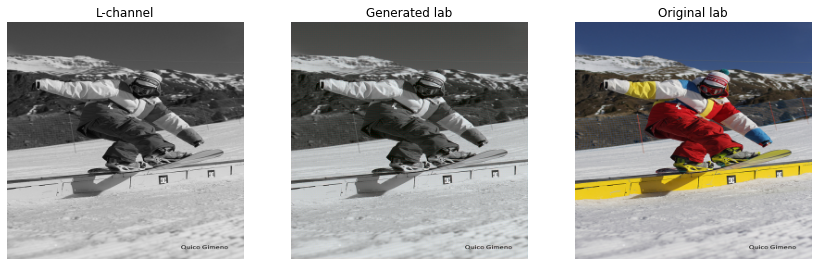

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:1   trained in 4min9sec
Discriminator train loss: 3.1082348823547363 ;  Discriminator test loss: 3.443622350692749
Generator train loss: 9.364604949951172 ;  Generator test loss: 7.101390838623047
Generator train L1 loss: 0.1075509563088417 ;  Generator test L1 loss: 0.14974717795848846
Generator train total loss (loss+l1): 20.119701385498047 ;  Generator test total loss (loss+l1): 22.076108932495117


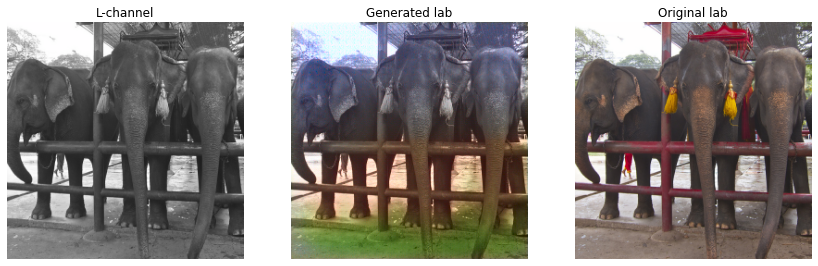

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:2   trained in 4min34sec
Discriminator train loss: 3.246335506439209 ;  Discriminator test loss: 3.218564033508301
Generator train loss: 11.029825210571289 ;  Generator test loss: 9.162579536437988
Generator train L1 loss: 0.09935691952705383 ;  Generator test L1 loss: 0.12152023613452911
Generator train total loss (loss+l1): 20.96551513671875 ;  Generator test total loss (loss+l1): 21.314603805541992


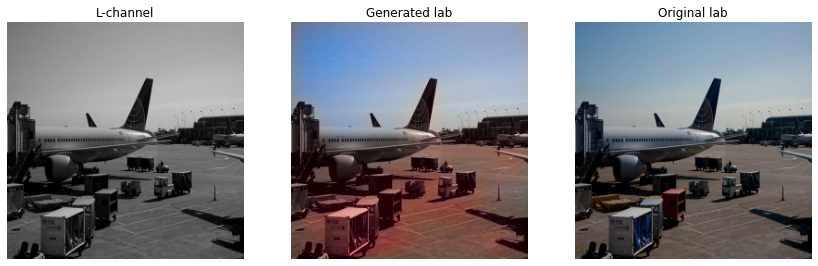

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:3   trained in 3min54sec
Discriminator train loss: 3.2643048763275146 ;  Discriminator test loss: 4.0348429679870605
Generator train loss: 10.29973030090332 ;  Generator test loss: 5.717058181762695
Generator train L1 loss: 0.09423056244850159 ;  Generator test L1 loss: 0.12161064893007278
Generator train total loss (loss+l1): 19.72278594970703 ;  Generator test total loss (loss+l1): 17.878122329711914


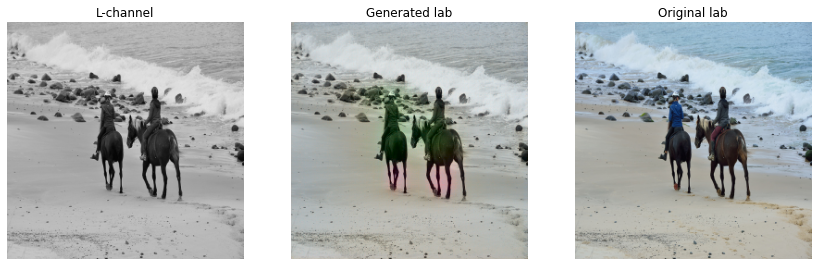

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:4   trained in 3min54sec
Discriminator train loss: 3.2819876670837402 ;  Discriminator test loss: 3.567293405532837
Generator train loss: 9.951960563659668 ;  Generator test loss: 8.736821174621582
Generator train L1 loss: 0.09389843791723251 ;  Generator test L1 loss: 0.10497961193323135
Generator train total loss (loss+l1): 19.34180450439453 ;  Generator test total loss (loss+l1): 19.23478126525879


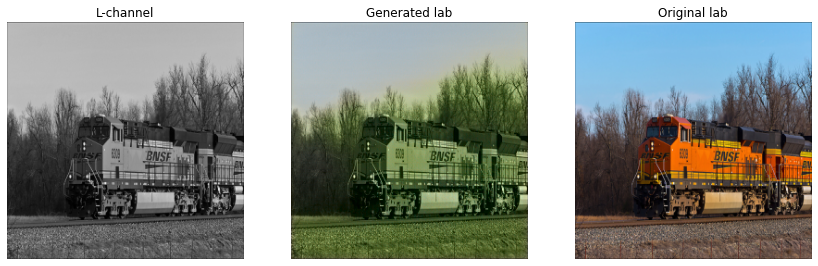

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:5   trained in 3min54sec
Discriminator train loss: 3.267409563064575 ;  Discriminator test loss: 3.278383493423462
Generator train loss: 9.479403495788574 ;  Generator test loss: 11.559359550476074
Generator train L1 loss: 0.09305940568447113 ;  Generator test L1 loss: 0.0947502925992012
Generator train total loss (loss+l1): 18.78534698486328 ;  Generator test total loss (loss+l1): 21.034387588500977


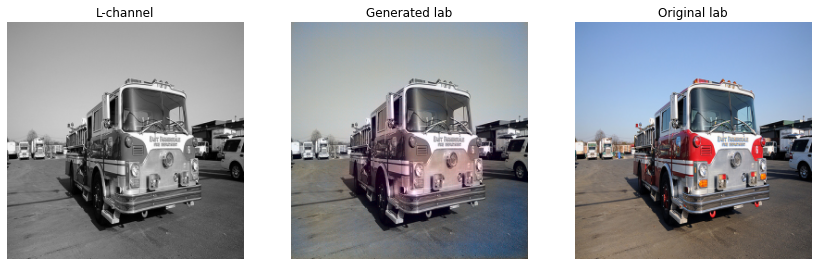

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:6   trained in 4min34sec
Discriminator train loss: 3.263301134109497 ;  Discriminator test loss: 3.563441276550293
Generator train loss: 9.074227333068848 ;  Generator test loss: 7.736184120178223
Generator train L1 loss: 0.09381522238254547 ;  Generator test L1 loss: 0.1008051186800003
Generator train total loss (loss+l1): 18.45574951171875 ;  Generator test total loss (loss+l1): 17.816696166992188


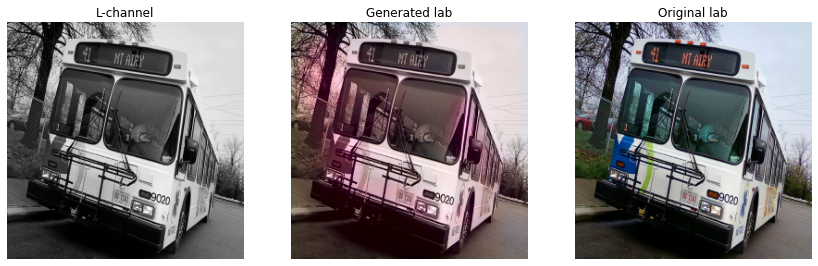

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:7   trained in 3min54sec
Discriminator train loss: 3.2969391345977783 ;  Discriminator test loss: 3.6405463218688965
Generator train loss: 9.388895034790039 ;  Generator test loss: 6.759965419769287
Generator train L1 loss: 0.09143617749214172 ;  Generator test L1 loss: 0.09615299105644226
Generator train total loss (loss+l1): 18.532512664794922 ;  Generator test total loss (loss+l1): 16.37526512145996


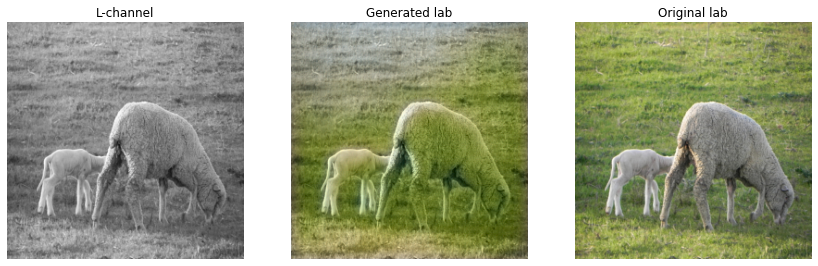

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:8   trained in 3min54sec
Discriminator train loss: 3.285504102706909 ;  Discriminator test loss: 3.3085639476776123
Generator train loss: 6.227592945098877 ;  Generator test loss: 2.4598474502563477
Generator train L1 loss: 0.09206405282020569 ;  Generator test L1 loss: 0.08364515006542206
Generator train total loss (loss+l1): 15.433998107910156 ;  Generator test total loss (loss+l1): 10.824362754821777


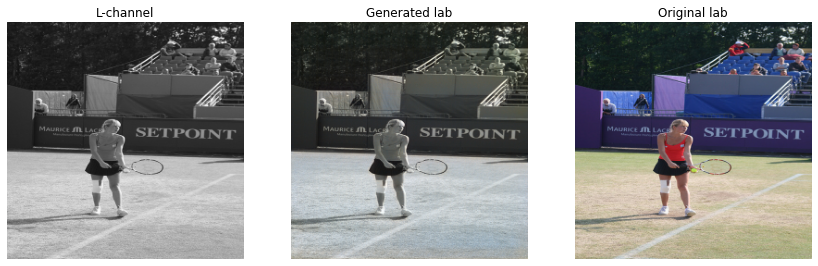

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:9   trained in 4min34sec
Discriminator train loss: 3.3198623657226562 ;  Discriminator test loss: 3.339543342590332
Generator train loss: 5.786989212036133 ;  Generator test loss: 9.362298011779785
Generator train L1 loss: 0.0912022516131401 ;  Generator test L1 loss: 0.0891542136669159
Generator train total loss (loss+l1): 14.90721321105957 ;  Generator test total loss (loss+l1): 18.277721405029297


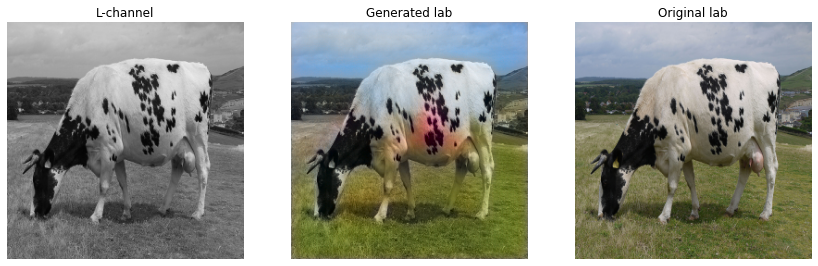

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:10   trained in 4min35sec
Discriminator train loss: 3.2863008975982666 ;  Discriminator test loss: 3.221209764480591
Generator train loss: 7.659887313842773 ;  Generator test loss: 6.0953168869018555
Generator train L1 loss: 0.08836960047483444 ;  Generator test L1 loss: 0.09750255942344666
Generator train total loss (loss+l1): 16.49684715270996 ;  Generator test total loss (loss+l1): 15.845572471618652


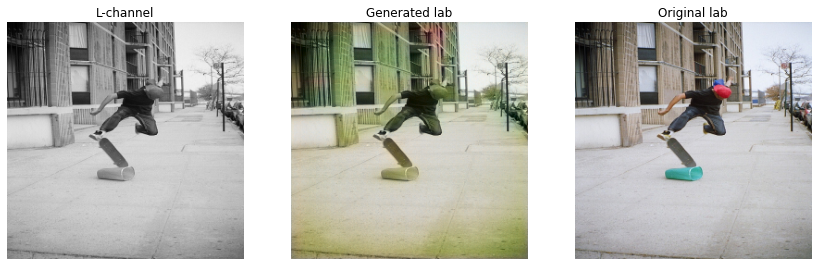

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:11   trained in 4min35sec
Discriminator train loss: 3.2917349338531494 ;  Discriminator test loss: 3.418182373046875
Generator train loss: 3.965320348739624 ;  Generator test loss: 3.014475107192993
Generator train L1 loss: 0.08984322845935822 ;  Generator test L1 loss: 0.08819734305143356
Generator train total loss (loss+l1): 12.949642181396484 ;  Generator test total loss (loss+l1): 11.834210395812988


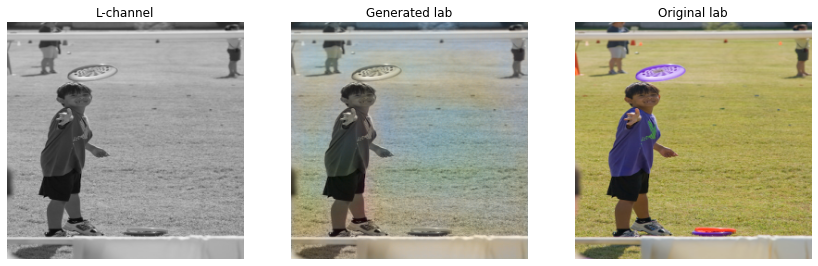

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:12   trained in 3min55sec
Discriminator train loss: 3.315432548522949 ;  Discriminator test loss: 3.2930097579956055
Generator train loss: 5.8182759284973145 ;  Generator test loss: 4.913773059844971
Generator train L1 loss: 0.08907369524240494 ;  Generator test L1 loss: 0.08748000115156174
Generator train total loss (loss+l1): 14.7256441116333 ;  Generator test total loss (loss+l1): 13.661773681640625


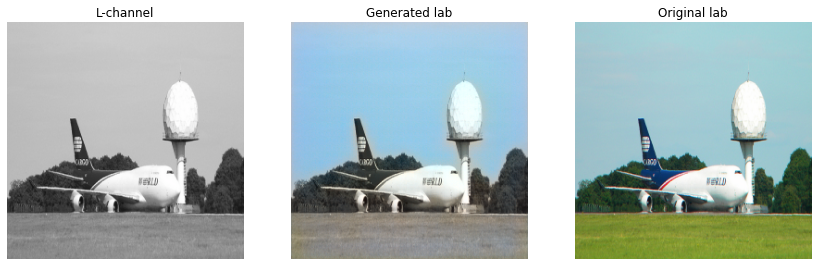

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:13   trained in 3min55sec
Discriminator train loss: 3.3210997581481934 ;  Discriminator test loss: 3.3689064979553223
Generator train loss: 5.373715400695801 ;  Generator test loss: 5.269101142883301
Generator train L1 loss: 0.08927290141582489 ;  Generator test L1 loss: 0.09601011127233505
Generator train total loss (loss+l1): 14.301004409790039 ;  Generator test total loss (loss+l1): 14.870112419128418


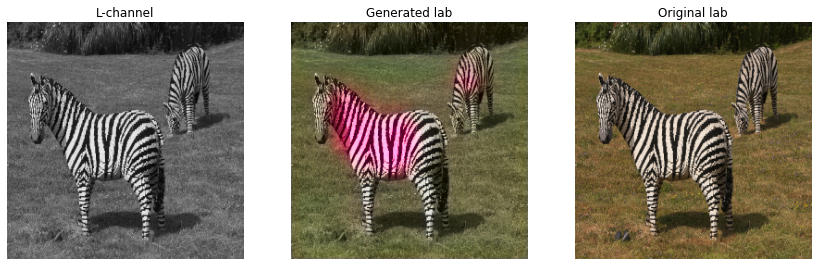

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:14   trained in 3min53sec
Discriminator train loss: 3.3230044841766357 ;  Discriminator test loss: 3.3865461349487305
Generator train loss: 5.956779956817627 ;  Generator test loss: 5.468648910522461
Generator train L1 loss: 0.08722499758005142 ;  Generator test L1 loss: 0.08503924310207367
Generator train total loss (loss+l1): 14.679279327392578 ;  Generator test total loss (loss+l1): 13.972573280334473


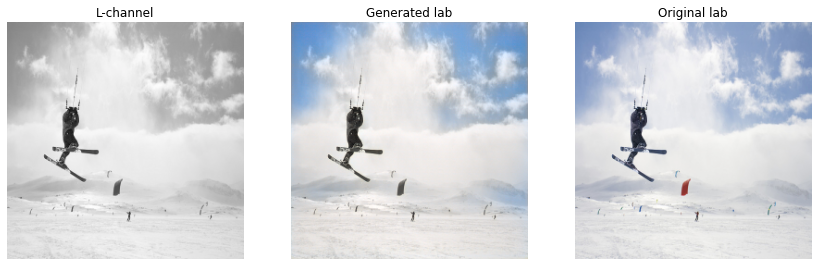

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:15   trained in 3min53sec
Discriminator train loss: 3.3322031497955322 ;  Discriminator test loss: 3.3045554161071777
Generator train loss: 6.473699569702148 ;  Generator test loss: 8.445474624633789
Generator train L1 loss: 0.08917523175477982 ;  Generator test L1 loss: 0.08550253510475159
Generator train total loss (loss+l1): 15.39122200012207 ;  Generator test total loss (loss+l1): 16.995729446411133


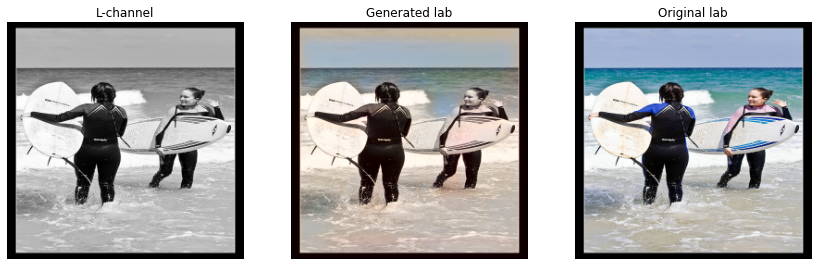

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:16   trained in 3min53sec
Discriminator train loss: 3.336709976196289 ;  Discriminator test loss: 3.378263235092163
Generator train loss: 6.195127964019775 ;  Generator test loss: 6.290406703948975
Generator train L1 loss: 0.08846107125282288 ;  Generator test L1 loss: 0.08230634778738022
Generator train total loss (loss+l1): 15.041234970092773 ;  Generator test total loss (loss+l1): 14.521040916442871


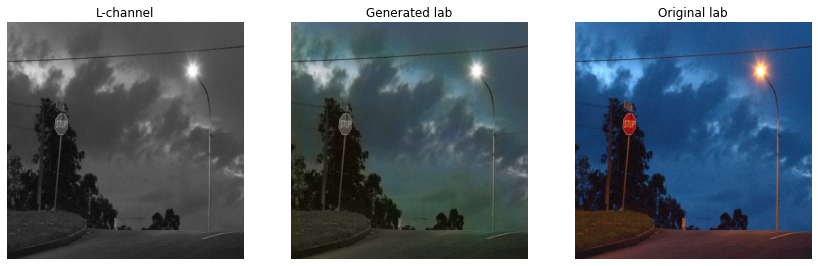

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:17   trained in 3min53sec
Discriminator train loss: 3.313588857650757 ;  Discriminator test loss: 3.504995107650757
Generator train loss: 5.198012828826904 ;  Generator test loss: 7.680744647979736
Generator train L1 loss: 0.08575483411550522 ;  Generator test L1 loss: 0.09257490932941437
Generator train total loss (loss+l1): 13.7734956741333 ;  Generator test total loss (loss+l1): 16.938234329223633


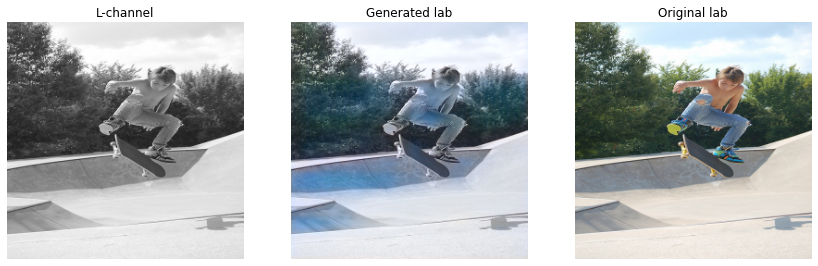

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:18   trained in 3min53sec
Discriminator train loss: 3.3396191596984863 ;  Discriminator test loss: 3.266690969467163
Generator train loss: 5.4075469970703125 ;  Generator test loss: 7.402890682220459
Generator train L1 loss: 0.08576160669326782 ;  Generator test L1 loss: 0.08764955401420593
Generator train total loss (loss+l1): 13.983707427978516 ;  Generator test total loss (loss+l1): 16.1678466796875


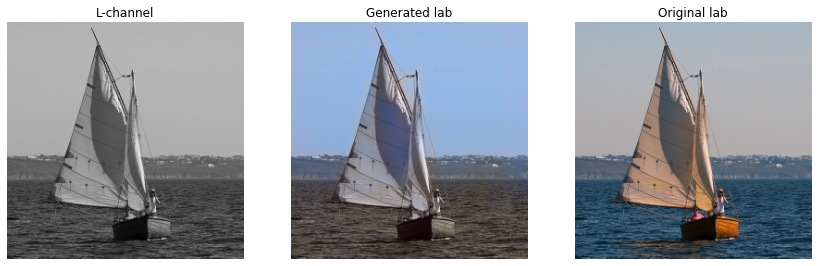

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:19   trained in 3min53sec
Discriminator train loss: 3.314318895339966 ;  Discriminator test loss: 3.422508955001831
Generator train loss: 5.65766716003418 ;  Generator test loss: 4.521708011627197
Generator train L1 loss: 0.08521760255098343 ;  Generator test L1 loss: 0.10127277672290802
Generator train total loss (loss+l1): 14.179427146911621 ;  Generator test total loss (loss+l1): 14.648985862731934


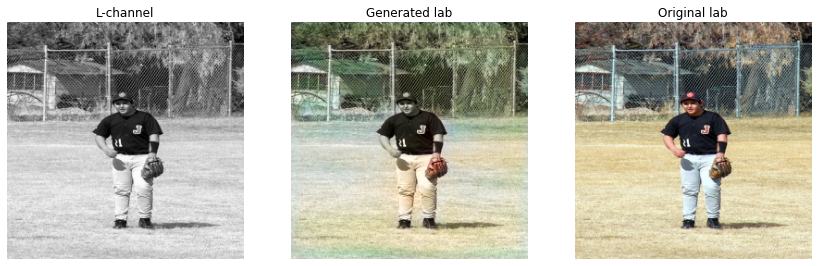

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:20   trained in 3min54sec
Discriminator train loss: 3.3192052841186523 ;  Discriminator test loss: 3.3483731746673584
Generator train loss: 5.416871547698975 ;  Generator test loss: 7.862959384918213
Generator train L1 loss: 0.08520368486642838 ;  Generator test L1 loss: 0.08611637353897095
Generator train total loss (loss+l1): 13.937239646911621 ;  Generator test total loss (loss+l1): 16.474597930908203


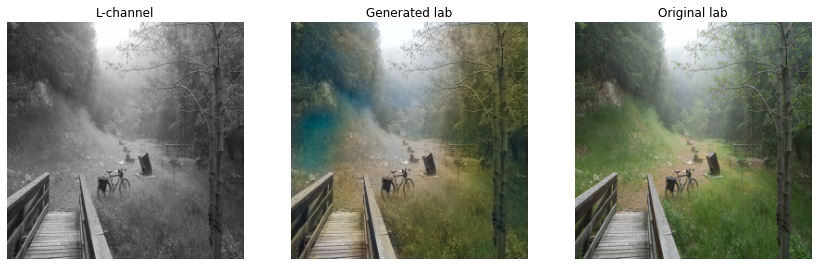

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:21   trained in 3min54sec
Discriminator train loss: 3.322507858276367 ;  Discriminator test loss: 2.6000802516937256
Generator train loss: 6.483576774597168 ;  Generator test loss: 9.297951698303223
Generator train L1 loss: 0.08353427797555923 ;  Generator test L1 loss: 0.14363405108451843
Generator train total loss (loss+l1): 14.837004661560059 ;  Generator test total loss (loss+l1): 23.661354064941406


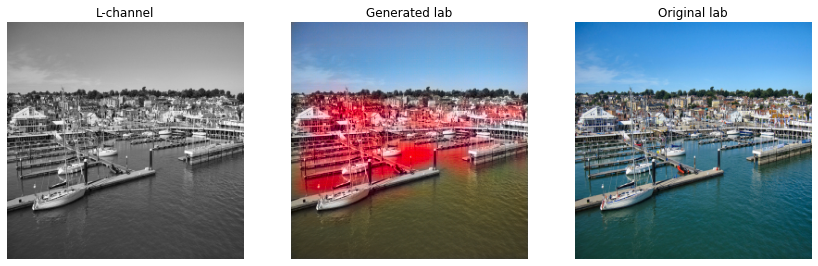

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:22   trained in 3min54sec
Discriminator train loss: 3.325740337371826 ;  Discriminator test loss: 3.5434212684631348
Generator train loss: 5.845724105834961 ;  Generator test loss: 5.543812274932861
Generator train L1 loss: 0.08490535616874695 ;  Generator test L1 loss: 0.09466664493083954
Generator train total loss (loss+l1): 14.336258888244629 ;  Generator test total loss (loss+l1): 15.010476112365723


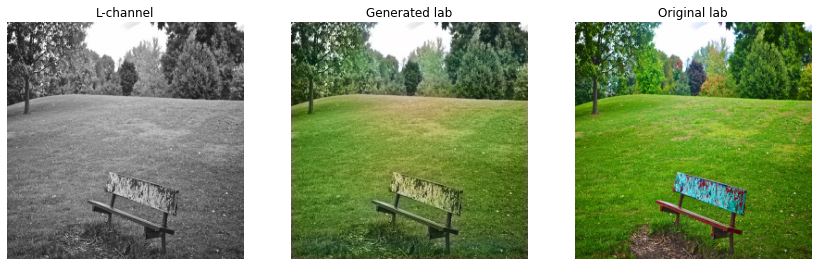

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:23   trained in 3min54sec
Discriminator train loss: 3.3244080543518066 ;  Discriminator test loss: 3.399271011352539
Generator train loss: 5.607334136962891 ;  Generator test loss: 3.6067724227905273
Generator train L1 loss: 0.08370780944824219 ;  Generator test L1 loss: 0.09666576236486435
Generator train total loss (loss+l1): 13.97811508178711 ;  Generator test total loss (loss+l1): 13.273348808288574


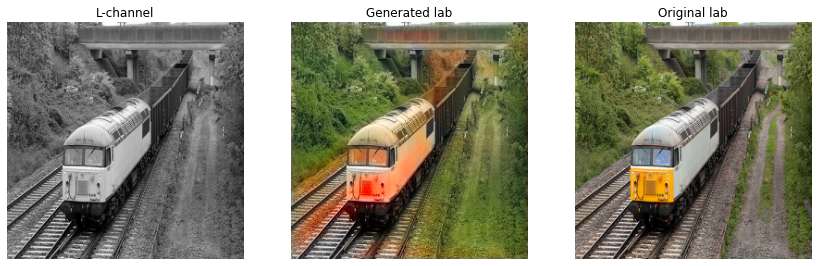

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:24   trained in 4min35sec
Discriminator train loss: 3.3206114768981934 ;  Discriminator test loss: 3.5236403942108154
Generator train loss: 5.944673538208008 ;  Generator test loss: 6.674023628234863
Generator train L1 loss: 0.08232490718364716 ;  Generator test L1 loss: 0.08935103565454483
Generator train total loss (loss+l1): 14.177164077758789 ;  Generator test total loss (loss+l1): 15.609127044677734


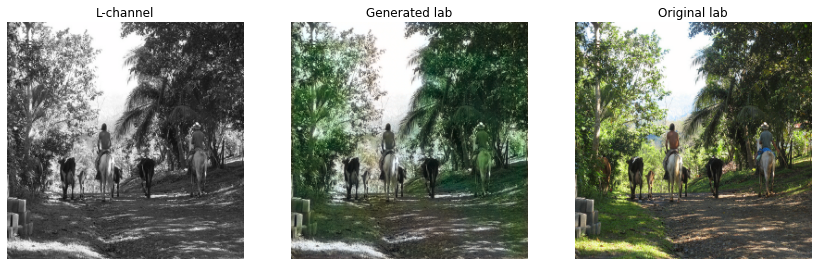

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:25   trained in 4min35sec
Discriminator train loss: 3.3460936546325684 ;  Discriminator test loss: 3.5195624828338623
Generator train loss: 6.226228713989258 ;  Generator test loss: 4.2384934425354
Generator train L1 loss: 0.08219825476408005 ;  Generator test L1 loss: 0.08861179649829865
Generator train total loss (loss+l1): 14.446054458618164 ;  Generator test total loss (loss+l1): 13.0996732711792


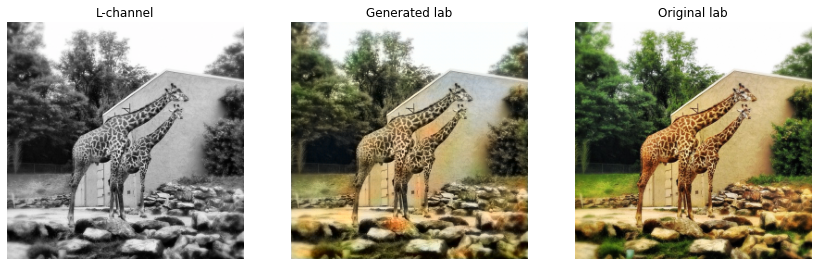

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:26   trained in 3min55sec
Discriminator train loss: 3.3266382217407227 ;  Discriminator test loss: 3.1140809059143066
Generator train loss: 4.1248393058776855 ;  Generator test loss: 5.8079071044921875
Generator train L1 loss: 0.07945328950881958 ;  Generator test L1 loss: 0.09070900082588196
Generator train total loss (loss+l1): 12.070168495178223 ;  Generator test total loss (loss+l1): 14.878807067871094


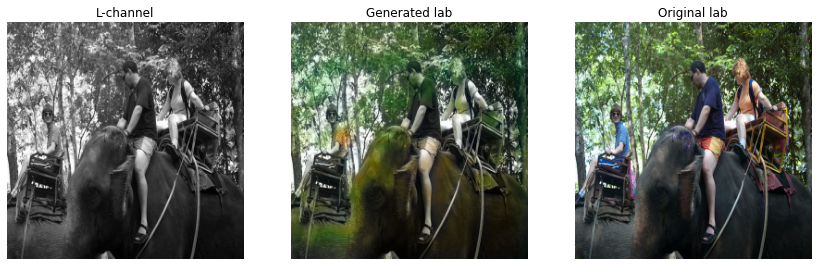

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:27   trained in 4min35sec
Discriminator train loss: 3.3300912380218506 ;  Discriminator test loss: 3.1748464107513428
Generator train loss: 4.8994927406311035 ;  Generator test loss: 7.474764347076416
Generator train L1 loss: 0.07904534786939621 ;  Generator test L1 loss: 0.08842733502388
Generator train total loss (loss+l1): 12.804028511047363 ;  Generator test total loss (loss+l1): 16.31749725341797


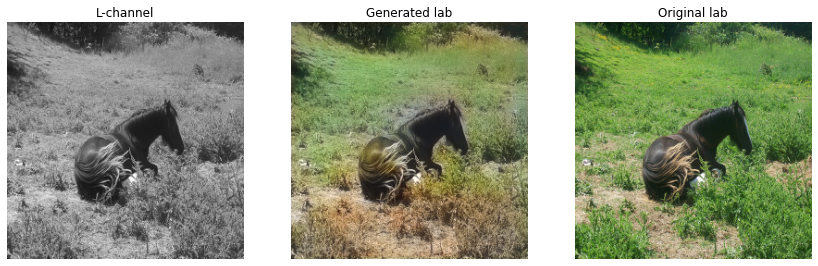

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:28   trained in 4min35sec
Discriminator train loss: 3.328482151031494 ;  Discriminator test loss: 3.3144469261169434
Generator train loss: 5.740933895111084 ;  Generator test loss: 6.920738697052002
Generator train L1 loss: 0.07747942954301834 ;  Generator test L1 loss: 0.08971469104290009
Generator train total loss (loss+l1): 13.488877296447754 ;  Generator test total loss (loss+l1): 15.892206192016602


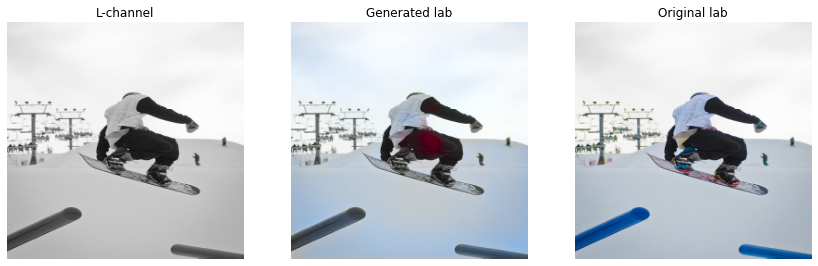

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:29   trained in 3min55sec
Discriminator train loss: 3.3314452171325684 ;  Discriminator test loss: 3.359515428543091
Generator train loss: 4.452993392944336 ;  Generator test loss: 3.218348979949951
Generator train L1 loss: 0.07784400135278702 ;  Generator test L1 loss: 0.08597629517316818
Generator train total loss (loss+l1): 12.23739242553711 ;  Generator test total loss (loss+l1): 11.81597900390625


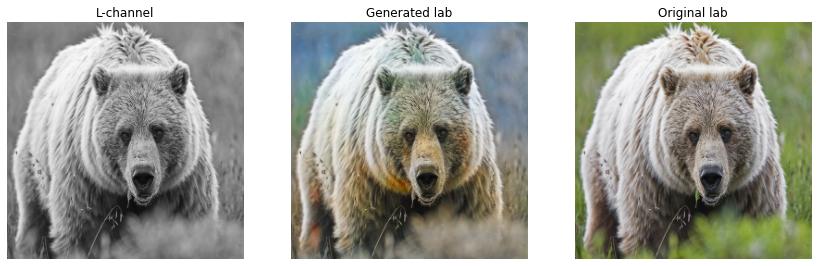

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch:30   trained in 4min35sec
Discriminator train loss: 3.3414065837860107 ;  Discriminator test loss: 3.318052053451538
Generator train loss: 5.552043914794922 ;  Generator test loss: 4.794894218444824
Generator train L1 loss: 0.07543764263391495 ;  Generator test L1 loss: 0.08698897063732147
Generator train total loss (loss+l1): 13.095808982849121 ;  Generator test total loss (loss+l1): 13.493791580200195


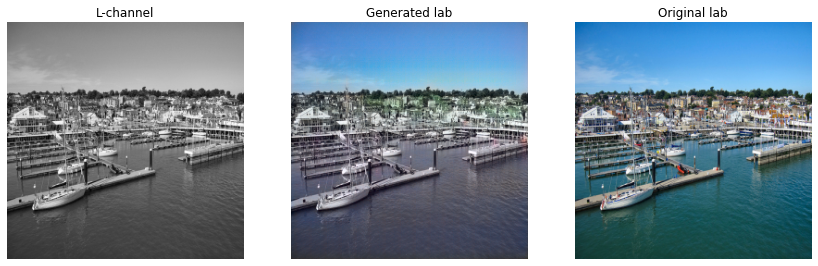

In [ ]:
# testing once before we begin
test_d_loss, test_g_loss_total, test_g_loss, test_g_l1, generated_ab_img, l_img, original_ab_img = test(generator, discriminator, test_ds, bce_loss)
# track loss
test_g_losses_total, test_g_losses, test_g_losses_l1, test_d_losses = append_losses(test_g_losses_total, test_g_losses, test_g_losses_l1, test_d_losses, test_g_loss_total, test_g_loss, test_g_l1, test_d_loss)

# Visualize L-channel, Original lab image and Generated lab image before training
print("Result before training: ")
plot_imgs(l_img, original_ab_img, generated_ab_img)

# check how model performs on train data once before we begin
train_d_loss, train_g_loss_total, train_g_loss, train_g_l1, _, _, _ = test(generator, discriminator, train_ds, bce_loss)
# track loss
train_g_losses_total, train_g_losses, train_g_losses_l1, train_d_losses = append_losses(train_g_losses_total, train_g_losses, train_g_losses_l1, train_d_losses, train_g_loss_total, train_g_loss, train_g_l1, train_d_loss)

# We train for NUM_EPOCHS epochs
for epoch in range(NUM_EPOCHS):
    # Initialize Time
    start_time = time.time()

    # Iterate through training data
    train_d_loss, train_g_loss_total, train_g_loss, train_g_l1 = train_step(generator, discriminator, train_ds, bce_loss, discriminator_optimizer, generator_optimizer)
    # track training loss
    train_g_losses_total, train_g_losses, train_g_losses_l1, train_d_losses = append_losses(train_g_losses_total, train_g_losses, train_g_losses_l1, train_d_losses, train_g_loss_total, train_g_loss, train_g_l1, train_d_loss)


    # testing, so we can track test loss
    test_d_loss, test_g_loss_total, test_g_loss, test_g_l1, generated_ab_img, l_img, original_ab_img = test(generator, discriminator, test_ds, bce_loss)
    # track test loss
    test_g_losses_total, test_g_losses, test_g_losses_l1, test_d_losses = append_losses(test_g_losses_total, test_g_losses, test_g_losses_l1, test_d_losses, test_g_loss_total, test_g_loss, test_g_l1, test_d_loss)

    # Calculate time for training annd testing
    used_time = time.time() - start_time

    # Print information
    print(f'Epoch:{epoch+1}   trained in {int(used_time // 60)}min{int(used_time % 60)}sec')
    print(f'Discriminator train loss: {train_d_losses[-1]} ;  Discriminator test loss: {test_d_losses[-1]}')
    print(f'Generator train loss: {train_g_losses[-1]} ;  Generator test loss: {test_g_losses[-1]}')
    print(f'Generator train L1 loss: {train_g_losses_l1[-1]} ;  Generator test L1 loss: {test_g_losses_l1[-1]}')
    print(f'Generator train total loss (loss+l1): {train_g_losses_total[-1]} ;  Generator test total loss (loss+l1): {test_g_losses_total[-1]}')

    # Visualize L-channel, Original lab image and Generated lab image
    plot_imgs(l_img, original_ab_img, generated_ab_img)

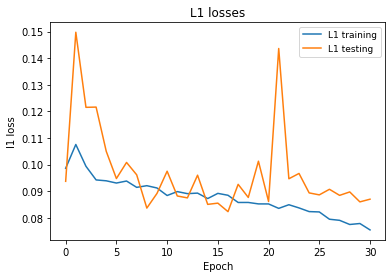

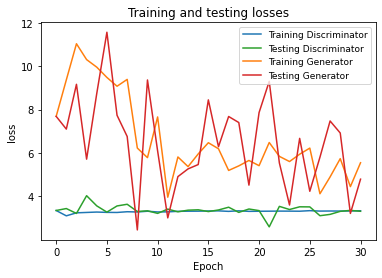

In [ ]:
# Visualize losses
loss_visualization(train_d_losses, train_g_losses, train_g_losses_l1, test_d_losses, test_g_losses, test_g_losses_l1, "l1")
loss_visualization(train_d_losses, train_g_losses, train_g_losses_l1, test_d_losses, test_g_losses, test_g_losses_l1, "general losses")